# Wind Strength and Wave Height Correlation Analysis

__Data Source:__   
1. Wind data comes from [ERA5 climate data from Climate Data Store](https://cds.climate.copernicus.eu/cdsapp#!/search?text=ERA5&type=dataset )
The wind data in this project comes from the 'ERA5 monthly averaged data on single levels from 1940 to present' dataset, specifically the 10m u-component of wind and 10m v-component of wind.  
The time period will be 2022 yearly data, and the area of interest will be Lake Erie.
2. Wave data comes from the final dataframe of the wave visualization page.

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import xarray as xr
from matplotlib import pyplot as plt
import holoviews as hv
import hvplot.pandas
# Load bokeh
hv.extension("bokeh")

In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

### Step 1: Read the .nc file downloaded from the ERA5 website and change it to a dataframe

Need to use xarry to read netCDF file

In [3]:
windnc = xr.open_dataset('./data/ERA5land.nc') 
winddf = windnc.to_dataframe().reset_index()

The raw data looks like this

In [4]:
winddf.head()

,longitude,latitude,time,u10,v10
0,-80.0,43.400002,2022-01-01,1.490095,-0.002929
1,-80.0,43.400002,2022-02-01,1.628315,0.594098
2,-80.0,43.400002,2022-03-01,1.543347,-0.034178
3,-80.0,43.400002,2022-04-01,1.104076,0.152090
4,-80.0,43.400002,2022-05-01,-0.122249,0.055608


In [5]:
winddf.dtypes

longitude           float64
latitude            float64
time         datetime64[ns]
u10                 float32
v10                 float32
dtype: object

### Step 2: Calculate wind strength and change to geodataframe

The wind strength is based on calculation of wind u and wind v

In [6]:
winddf['wind_strength'] = np.sqrt(winddf['u10']**2 + winddf['v10']**2)

Currently the data is arranged by days, but we need month value. Manipulate the dataframe to get the month column

In [7]:
winddf["month_int"] = winddf["time"].dt.month
wind_month = winddf.groupby(["month_int", "longitude", "latitude"])[["wind_strength"]].mean().reset_index()

Use the latitude and longitude column to get a geodataframe of wind data

In [8]:
wind_month["geometry"] = gpd.points_from_xy(
   wind_month["longitude"], wind_month["latitude"]
)
wind_month_gdf = gpd.GeoDataFrame(
    wind_month, geometry="geometry", crs="EPSG:4326"
)

The geodataframe looks like this

In [9]:
wind_month_gdf.head()

,month_int,longitude,latitude,wind_strength,geometry
0,1,-80.0,42.000000,1.075989,POINT (-80.00000 42.00000)
1,1,-80.0,42.099998,1.489239,POINT (-80.00000 42.10000)
2,1,-80.0,42.200001,1.999220,POINT (-80.00000 42.20000)
3,1,-80.0,42.299999,2.441840,POINT (-80.00000 42.30000)
4,1,-80.0,42.400002,2.715811,POINT (-80.00000 42.40000)


Have a look at the location of each wind data's point

In [10]:
wind_month_gdf.explore(column="wind_strength", 
                 tiles="CartoDB positron")


### Step 3: Read the wave dataframe that is cleaned in the wave data visualization page

In [11]:
wave = pd.read_csv("./data/wave2022.csv")

In [12]:
wave.head()

,time,latitude,longitude,waveHs,datetime,month_int,month,day_int,station
0,2022-01-01 00:00:00,42.32,-79.88,0.132812,2022-01-01 00:00:00,1,Jan,1,ST92023
1,2022-01-01 01:00:00,42.32,-79.88,0.140625,2022-01-01 01:00:00,1,Jan,1,ST92023
2,2022-01-01 02:00:00,42.32,-79.88,0.140625,2022-01-01 02:00:00,1,Jan,1,ST92023
3,2022-01-01 03:00:00,42.32,-79.88,0.140625,2022-01-01 03:00:00,1,Jan,1,ST92023
4,2022-01-01 04:00:00,42.32,-79.88,0.132812,2022-01-01 04:00:00,1,Jan,1,ST92023


This data is arranged by hours, need to group into months as well

In [13]:
wave_month = wave.groupby(["month_int", "station", "longitude", "latitude"])[["waveHs"]].mean().reset_index()

Change to a geodataframe

In [14]:
wave_month["geometry"] = gpd.points_from_xy(
   wave_month["longitude"], wave_month["latitude"]
)
wave_month_gdf = gpd.GeoDataFrame(
    wave_month, geometry="geometry", crs="EPSG:4326"
)

The final wave height geodataframe looks like this

In [15]:
wave_month_gdf.head()

,month_int,station,longitude,latitude,waveHs,geometry
0,1,ST92001,-79.04,42.76,1.102995,POINT (-79.04000 42.76000)
1,1,ST92002,-79.08,42.76,1.166224,POINT (-79.08000 42.76000)
2,1,ST92003,-79.12,42.72,1.220169,POINT (-79.12000 42.72000)
3,1,ST92004,-79.16,42.68,1.260833,POINT (-79.16000 42.68000)
4,1,ST92005,-79.20,42.64,1.242513,POINT (-79.20000 42.64000)


### Step 4: Match wave and wind data

Firstly, the wind data need to form a "container" that can be used to capture wave data near each point. Here each wind point will form a 8km buffer

__Note:__ Need to change to crs 3857 to make the buffer

In [16]:
buffered_wind_month_gdf = wind_month_gdf.copy().to_crs(epsg=3857)
buffered_wind_month_gdf["geometry"] = buffered_wind_month_gdf.buffer(8e3)

Have a look at the buffer location. It covers all the area

In [17]:
buffered_wind_month_gdf.explore(column="wind_strength", 
                 tiles="CartoDB positron")

Change back to 4326 to make it the same as the crs for wave data

In [18]:
buffer4326 = buffered_wind_month_gdf.to_crs(epsg=4326)

Because the point location is the same for different months, we need to seperatly do the sjoin for each month and then combine the results

A function can be helpful to handle these sjoins

In [19]:
def sjoin_different_month(wave, wind):
    """Do the sjoin between wave and wind for each month"""
    joined = gpd.sjoin(wave, wind, predicate="within", how="right")
    return joined

In [20]:
join_list = []
for i in range(12):
    month = i+1
    wave = wave_month_gdf.loc[wave_month_gdf['month_int']==month]
    wind = buffer4326.loc[buffer4326['month_int']==month]
    joined = sjoin_different_month(wave, wind)
    join_list.append(joined)
    

Combine the list into one dataframe

In [21]:
sjoin_all = pd.concat(join_list)

### Step 5: Regression models

When there is no overlap, the station column will not have data. We will use all the rows with station value to form a machine learning model to analyze the relationship between wind strength and wave height

Firstly, select all the rows with wave data to form the base for machine learning

In [22]:
model_set = sjoin_all[sjoin_all['station'].notna()]

In [23]:
model_set.head()

,index_left,month_int_left,station,longitude_left,latitude_left,waveHs,month_int_right,longitude_right,latitude_right,wind_strength,geometry
18,22.0,1.0,ST92023,-79.88,42.32,1.310742,1,-79.900002,42.299999,2.197481,"POLYGON ((-79.82814 42.30000, -79.82848 42.294..."
18,21.0,1.0,ST92022,-79.84,42.32,1.283843,1,-79.900002,42.299999,2.197481,"POLYGON ((-79.82814 42.30000, -79.82848 42.294..."
33,21.0,1.0,ST92022,-79.84,42.32,1.283843,1,-79.800003,42.299999,1.935837,"POLYGON ((-79.72814 42.30000, -79.72848 42.294..."
33,20.0,1.0,ST92021,-79.80,42.32,1.310535,1,-79.800003,42.299999,1.935837,"POLYGON ((-79.72814 42.30000, -79.72848 42.294..."
34,19.0,1.0,ST92020,-79.76,42.36,1.318989,1,-79.800003,42.400002,2.548905,"POLYGON ((-79.72814 42.40000, -79.72848 42.394..."


Before building the regression model, we can first visualize the relationship between wind strength and wave height through a scatter plot

In [24]:
model_set.hvplot.scatter(
    x="wind_strength",
    y="waveHs",
    width=700,
    scale=0.2,
    alpha=0.9,
    color='#E07069',
    title='Relationship between Wind Strength and Wave Height',
    xlabel="Wind Strength (m/s)",
    ylabel="Wave Height (m)"
)

:Scatter   [wind_strength]   (waveHs)

__Observation:__ It's a roughly linear relationship, so we can start with a linear model

Firstly, the whole dataset will be seperated into train and test sets

In [25]:
# use a 70/30% split
train_set, test_set = train_test_split(model_set, test_size=0.3, random_state=42)

These are new DataFrame objects, with lengths determined by the split percentage:

In [26]:
print("size of full dataset = ", len(model_set))
print("size of training dataset = ", len(train_set))
print("size of test dataset = ", len(test_set))

size of full dataset =  356
size of training dataset =  249
size of test dataset =  107


#### Part 1: Linear model

In [27]:
model = LinearRegression()

# Features
X_train = train_set['wind_strength'].values
X_train = X_train[:, np.newaxis]

X_test = test_set['wind_strength'].values
X_test = X_test[:, np.newaxis]

# Labels
y_train = train_set['waveHs'].values
y_test = test_set['waveHs'].values

Scale the wind strength values

In [28]:
scaler = StandardScaler()

In [29]:
# Scale the training features
X_train_scaled = scaler.fit_transform(X_train)

# Scale the test features
X_test_scaled = scaler.fit_transform(X_test)

Fit on the *training set* and evaluate on the *test set*

In [30]:
model.fit(X_train_scaled, y_train)

LinearRegression()

In [31]:
model.score(X_test_scaled, y_test)

0.3573253503257996

__Note:__ A model with R-squared coefficient of 0.357 means only 35.7% of the variation in the dataset can be explained by the model, which is pretty bad

Visualize linear prediction

In [32]:
# The values we want to predict (ranging from our min to max wind strength)
wh_pred = np.linspace(1.026, 4.651, 100)

# Sklearn needs the second axis!
X_pred = wh_pred[:, np.newaxis]

y_pred = model.predict(X_pred)

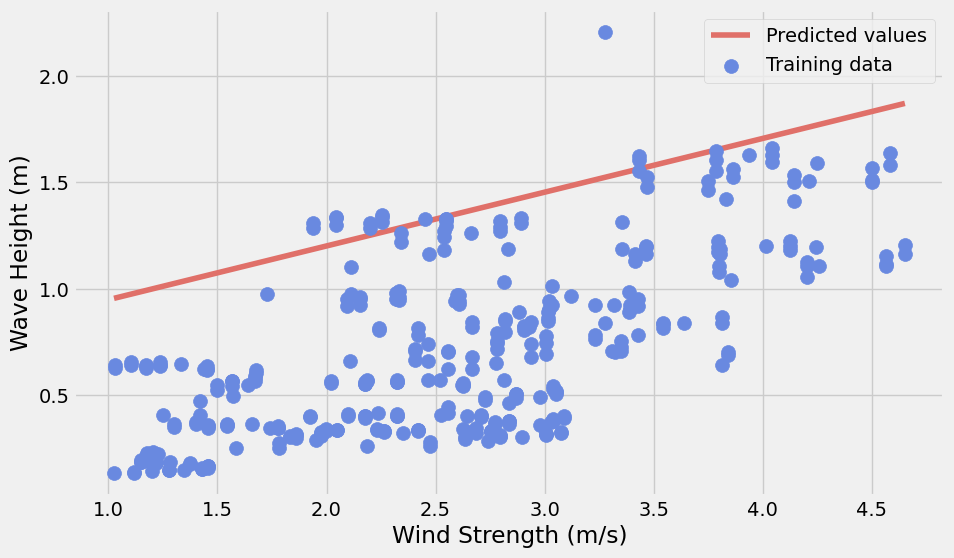

In [33]:
with plt.style.context("fivethirtyeight"):

    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot the predicted values
    ax.plot(X_pred, y_pred, label="Predicted values", color="#E07069")

    # Training data
    ax.scatter(
        model_set['wind_strength'],
        model_set['waveHs'],
        label="Training data",
        s=100,
        zorder=10,
        color="#6989E0",
    )

    ax.legend()
    ax.set_xlabel("Wind Strength (m/s)")
    ax.set_ylabel("Wave Height (m)")
    plt.show()

__Observation:__  
The linear model will significantly overpredict the wave height.

#### Part 2: Non-linear model

Since the linear model does not work will, we can try to add new polynomial features from the wind strength data. Besides, we will turn our preprocessing steps into a Pipeline object to make multiple transformations easier

__Note:__ After multiple testings, the degree 2 model is the best, so the following steps will use a degree value of 2

In [34]:
poly = PolynomialFeatures(degree=2)

In [35]:
# Training
X_train_scaled_poly = poly.fit_transform(scaler.fit_transform(X_train))

# Test
X_test_scaled_poly = poly.fit_transform(scaler.fit_transform(X_test))

In [36]:
model.fit(X_train_scaled_poly, y_train)

LinearRegression()

In [37]:
model.score(X_test_scaled_poly, y_test)

0.35844964445219063

Apply the pipeline to predict the wave height in the test set

In [38]:
pipe = make_pipeline(StandardScaler(), PolynomialFeatures(degree=2))

pipe

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('polynomialfeatures', PolynomialFeatures())])

In [39]:
y_pred = model.predict(pipe.fit_transform(X_pred))

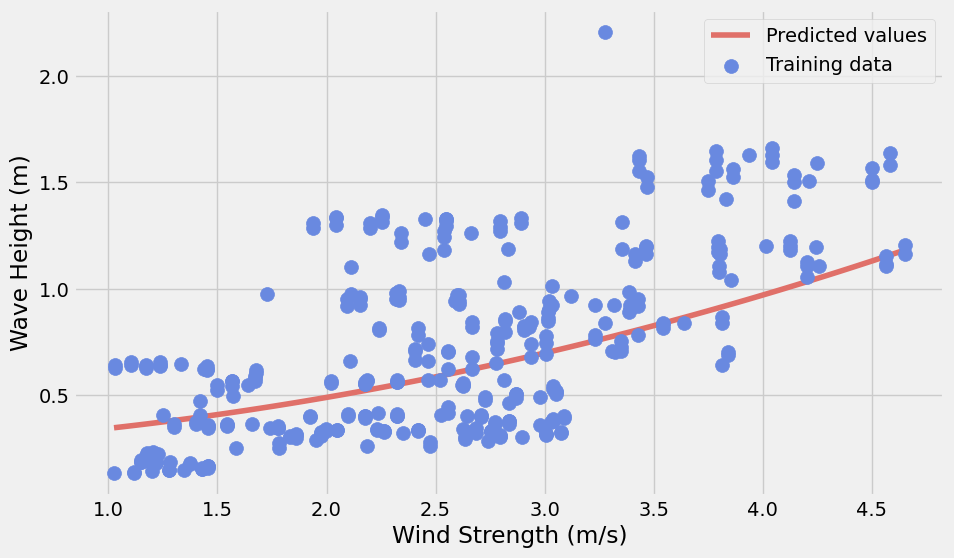

In [40]:
with plt.style.context("fivethirtyeight"):

    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot the predicted values
    y_pred = model.predict(pipe.fit_transform(X_pred))
    ax.plot(X_pred, y_pred, label="Predicted values", color="#E07069")

    # Training data
    ax.scatter(
        model_set['wind_strength'],
        model_set['waveHs'],
        label="Training data",
        s=100,
        zorder=10,
        color="#6989E0",
    )

    ax.legend()
    ax.set_xlabel("Wind Strength (m/s)")
    ax.set_ylabel("Wave Height (m)")
    plt.show()

__Observation:__  
Although the non-linear model is slightly better than the linear one, it is still very bad. It is not in a good condition to predict the wave height by using wind strength

__Conclusion:__
The wave height is a result of multiple factors. It is true that usually when wind strength increase, wave height will increase, this relationship doesn't have a strong regression relationship. More factors are needed to predict the wave height. Besides, the inputting data is not detailed enough to capture the real condition along the shoreline. Finer data may also possibly improve the model.